In [33]:
from utils.load_data import load_data
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [34]:
df, all_gdps = load_data()

In [35]:
# Convert 'date' to datetime
df['date'] = pd.to_datetime(df['date'])

# Set 'date' as the index
df.set_index('date', inplace=True)

# Identify search term columns
search_terms = [col for col in df.columns if col.endswith('_average')]

# Drop rows with missing values
df.dropna(inplace=True)

# Take only the first country
df = df[df['country'] == 'Switzerland']

# Create a time index
df['time_index'] = np.arange(len(df))

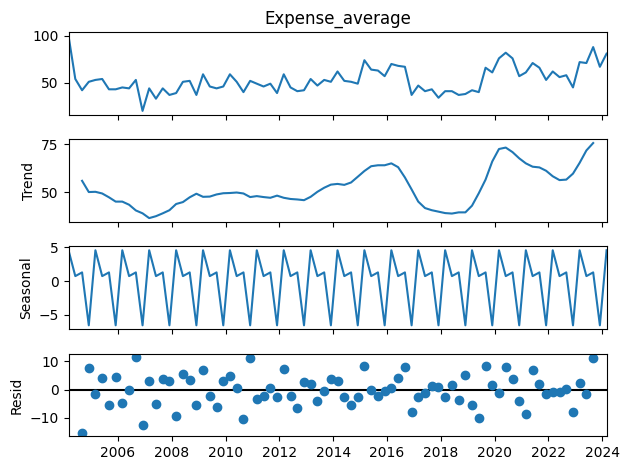

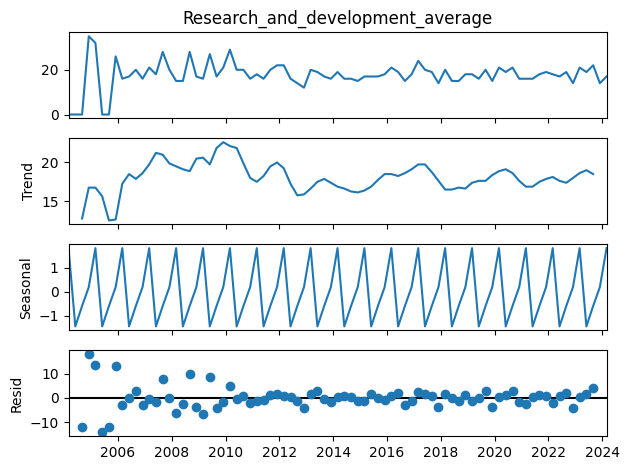

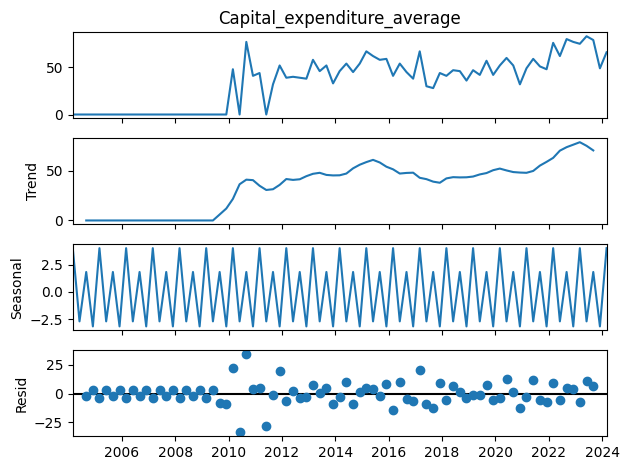

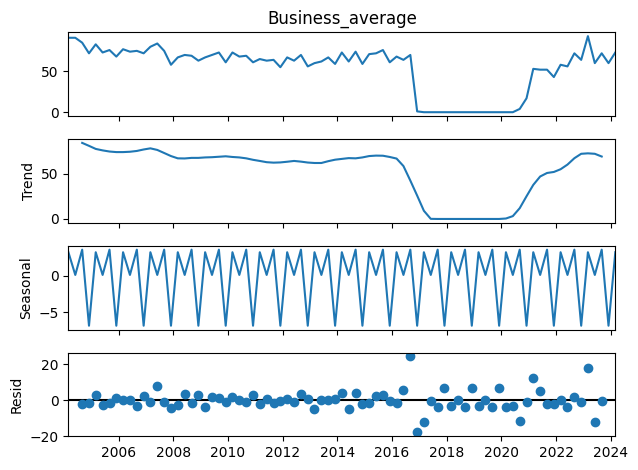

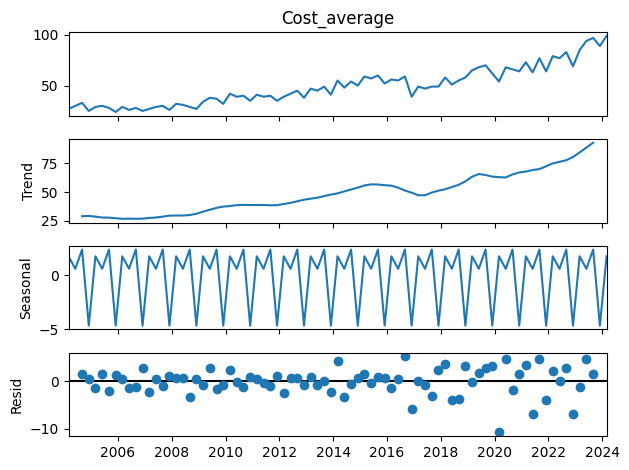

...

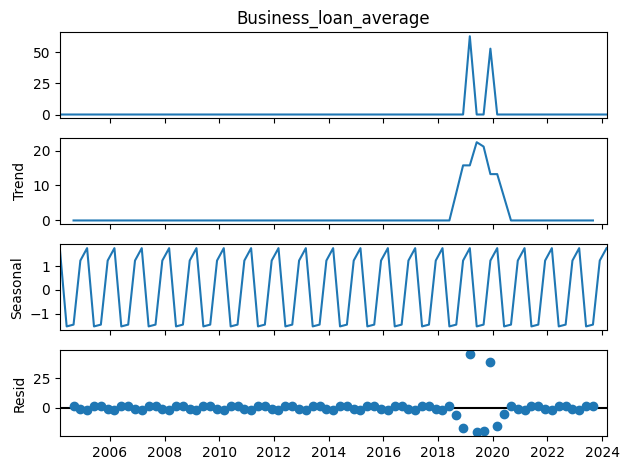

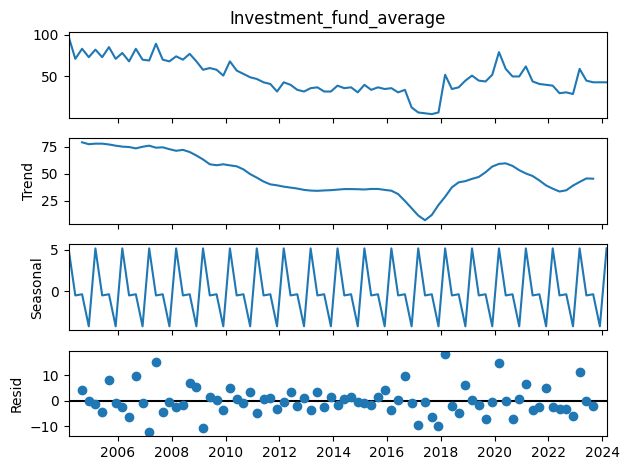

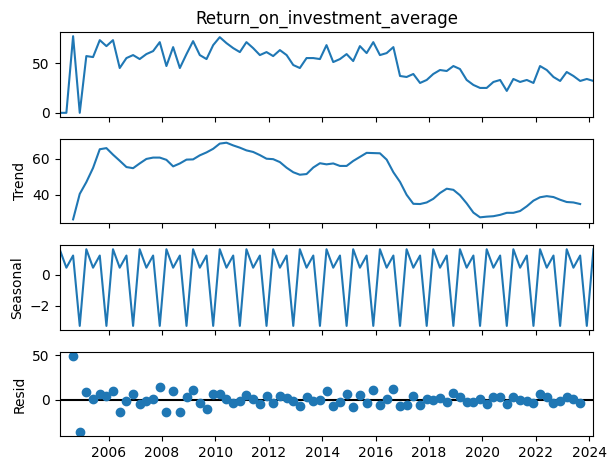

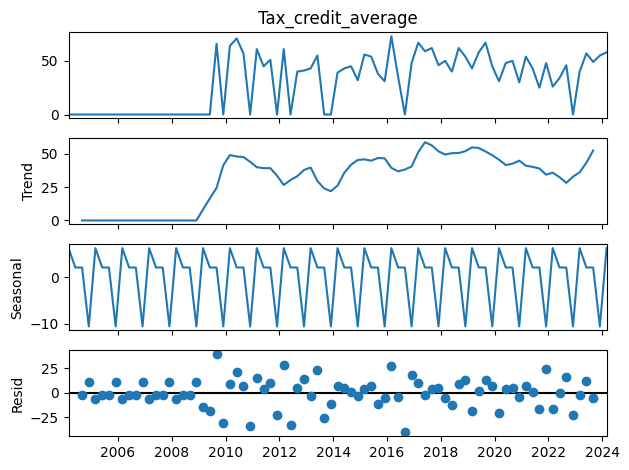

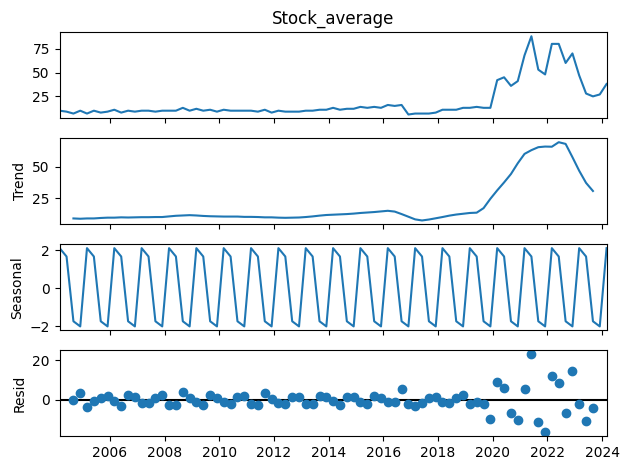

KeyboardInterrupt: 

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Remove non-numbered columns
df = df.select_dtypes(include=[np.number])

for term in search_terms:
    decompose_result = seasonal_decompose(df[term], model='additive', period=4)

    trend = decompose_result.trend
    seasonal = decompose_result.seasonal
    residual = decompose_result.resid
    trendplusresidual = trend + residual

    plt.figure(figsize=(12, 8))
    plt.plot(residual, label='Residual')
    plt.legend()
    plt.show()

    decompose_result.plot()
    plt.show()


In [ ]:
for term in search_terms:
    df[term].replace(0, np.nan, inplace=True)
    df[term].fillna(1, inplace=True)

    df[f'log_{term}'] = np.log(df[term])

    X = df['time_index'].values.reshape(-1, 1)
    y = df[f'log_{term}'].values.reshape(-1, 1)

    model = LinearRegression().fit(X, y)
    trend = model.predict(X)
    df[f'detrended_{term}'] = df[f'log_{term}'] - trend.flatten()


/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1274386084.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'log_{term}'] = np.log(df[term])
/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1274386084.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'detrended_{term}'] = df[f'log_{term}'] - trend.flatten()
/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1274386084.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.i

In [ ]:
from sklearn.linear_model import Ridge
import pandas as pd

# Create week-of-year feature
df['week_of_year'] = df.index.isocalendar().week

# Adjust week numbers if needed (e.g., combine weeks with few observations)
df['week_of_year'] = df['week_of_year'].astype(int)



# Create week dummies
week_dummies = pd.get_dummies(df['week_of_year'], prefix='week', drop_first=True)

# Regularization parameter (alpha)
alpha_value = 1

for term in search_terms:
    y = df[f'detrended_{term}']
    X = week_dummies

    # Fit Ridge Regression
    ridge = Ridge(alpha=alpha_value, fit_intercept=False)
    ridge.fit(X, y)
    seasonal_effect = ridge.predict(X)
    
    # Subtract seasonal component
    df[f'seasonal_{term}'] = seasonal_effect
    df[f'seasonally_adjusted_{term}'] = df[f'detrended_{term}'] - seasonal_effect

/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1129134172.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['week_of_year'] = df.index.isocalendar().week
/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1129134172.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'seasonal_{term}'] = seasonal_effect
/var/folders/2l/gzncbzsn4rq5pjd_b64p3qy00000gn/T/ipykernel_7740/1129134172.py:29: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

In [ ]:
df

,Expense_average,Research_and_development_average,Capital_expenditure_average,Business_average,Cost_average,Tax_average,Financial_capital_average,Investment_average,Gross_domestic_product_average,Credit_average,...,seasonal_Industrial_park_average,seasonally_adjusted_Industrial_park_average,seasonal_Semiconductor_average,seasonally_adjusted_Semiconductor_average,seasonal_Artificial_intelligence_average,seasonally_adjusted_Artificial_intelligence_average,seasonal_International_Financial_Reporting_Standards_average,seasonally_adjusted_International_Financial_Reporting_Standards_average,seasonal_Employment_average,seasonally_adjusted_Employment_average
date,,,,,,,,,,,,,,,,,,,,,
2004-03-01,100.0,1.0,1.0,91.0,27.0,67.8,1.0,98.0,1.0,66.0,...,-0.672989,-0.672989,0.488024,0.488024,0.316577,0.316577,-1.783686,-1.783686,0.126337,0.126337
2004-06-01,54.0,1.0,1.0,91.0,30.0,33.0,1.0,82.0,41.0,65.0,...,0.091049,-1.468161,0.005921,0.640497,-0.036639,0.371147,0.353203,0.574423,0.350048,-0.061167
2004-09-01,42.0,1.0,1.0,85.0,33.0,33.0,1.0,87.0,28.0,79.0,...,0.424972,-1.833217,0.050293,0.457180,-0.031735,0.460639,0.186730,0.736037,0.367863,-0.102482
2004-12-01,51.0,35.0,1.0,72.0,25.0,30.2,1.0,77.0,42.0,57.0,...,-0.904717,-0.534661,-0.258020,0.496120,-0.074786,0.492725,-0.633348,-2.928396,0.132907,-0.244165
2005-03-01,53.0,32.0,1.0,83.0,29.0,64.0,1.0,86.0,32.0,70.0,...,0.000000,-1.470512,0.000000,0.354146,0.000000,0.183832,0.000000,0.315491,0.000000,0.077417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-01,72.0,21.0,75.0,93.0,85.0,87.8,1.0,100.0,76.0,88.0,...,0.000000,-0.038342,0.000000,0.606396,0.000000,1.409296,0.000000,-0.023606,0.000000,0.988510
2023-06-01,71.0,19.0,83.0,60.0,94.0,55.2,1.0,82.0,61.0,86.0,...,0.013579,0.175005,-0.022033,0.327633,-0.016761,1.611208,0.109112,-0.171664,-0.086915,0.873233
2023-09-01,88.0,22.0,79.0,72.0,97.0,52.8,1.0,80.0,69.0,86.0,...,0.152292,-0.365620,0.030888,0.562009,-0.013528,1.540658,0.070345,-0.248804,-0.073361,0.949415


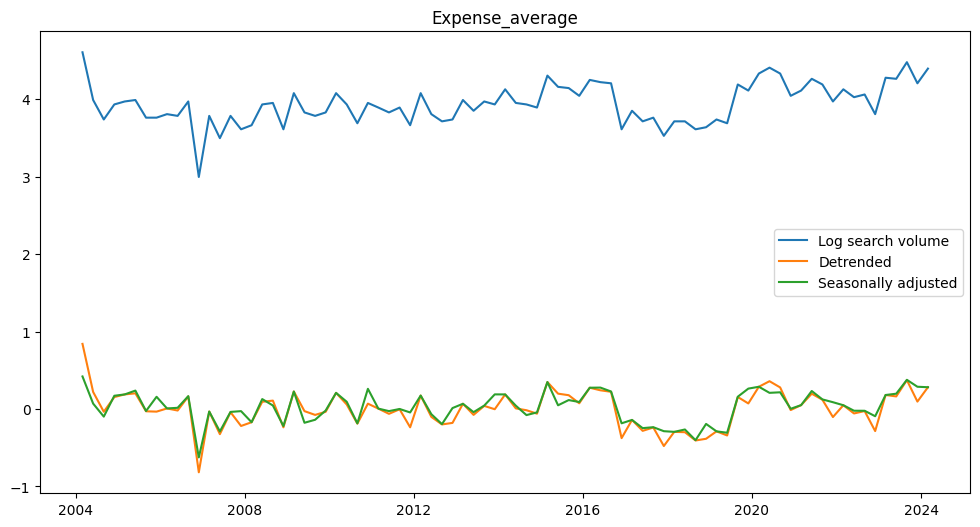

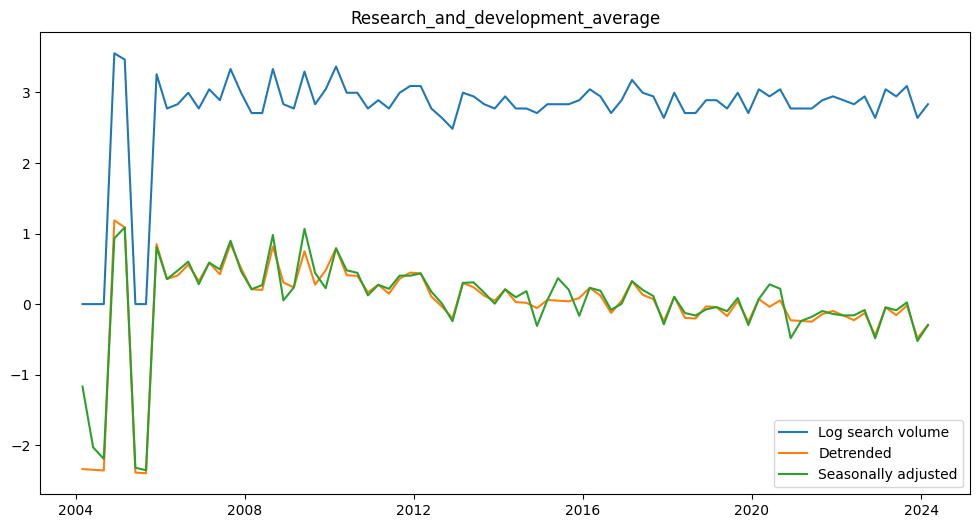

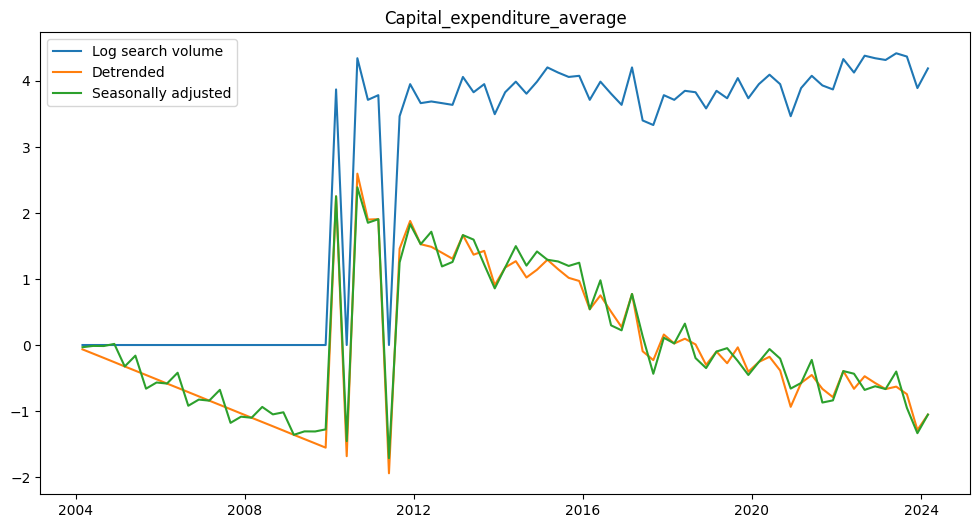

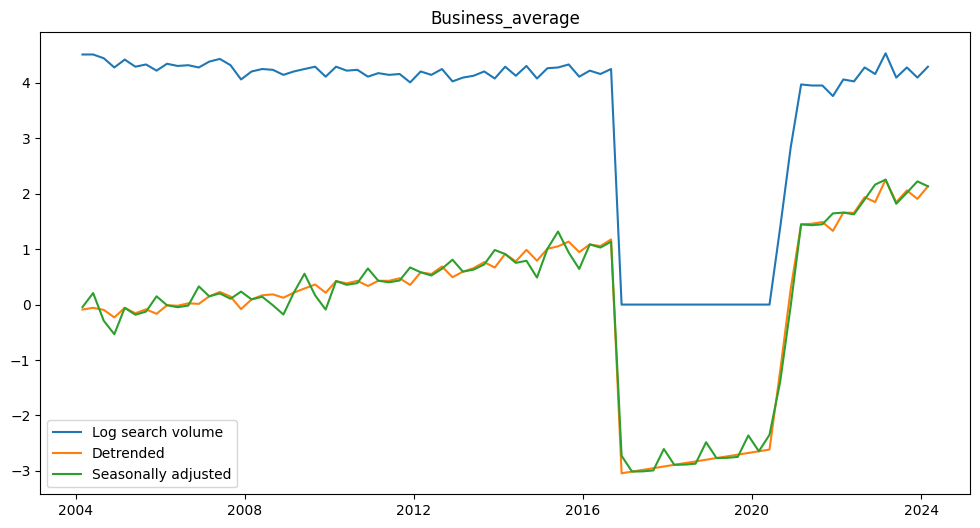

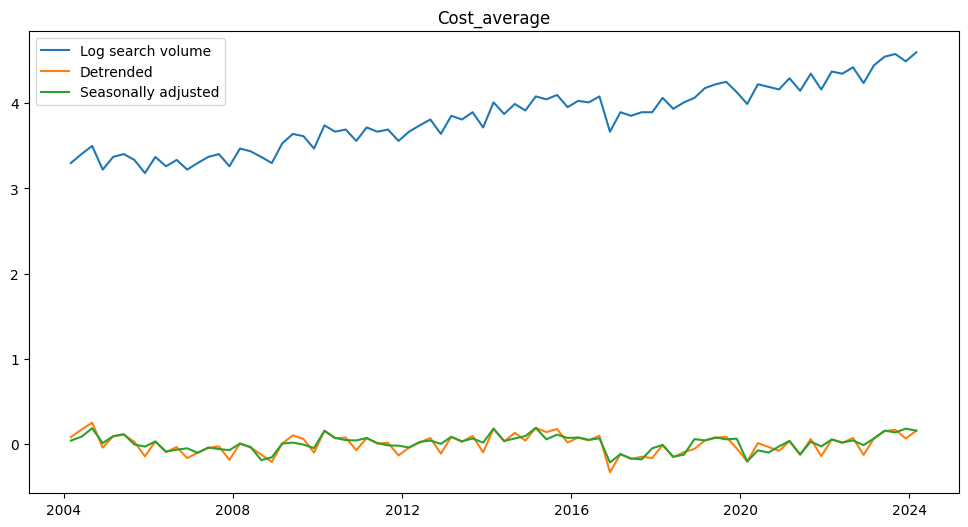

...

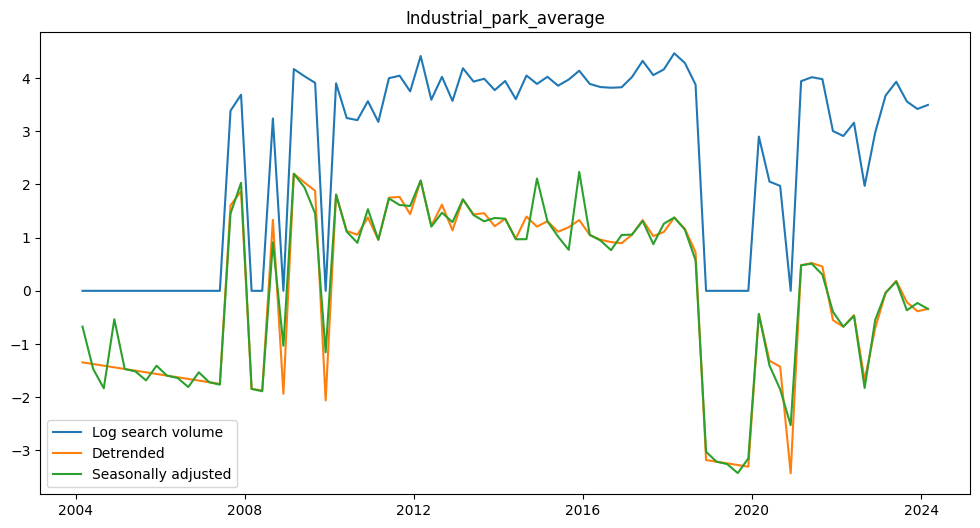

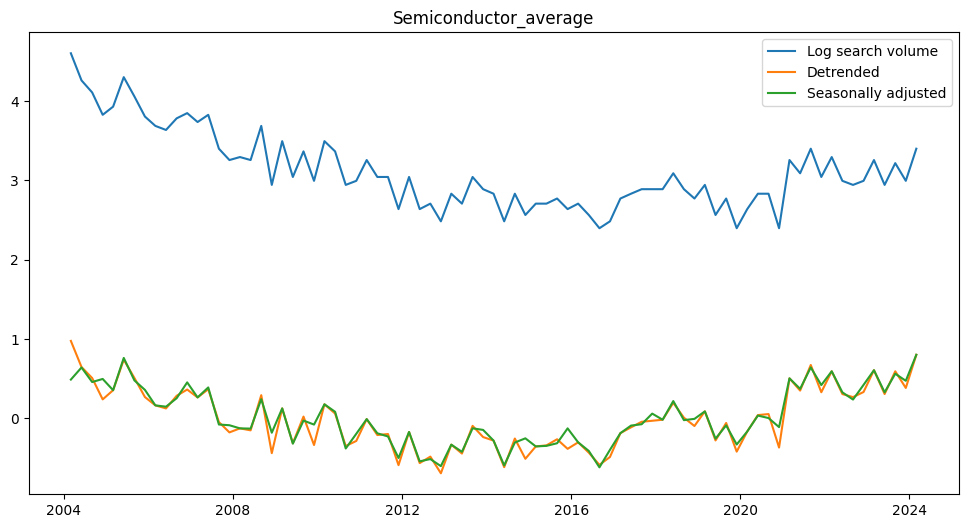

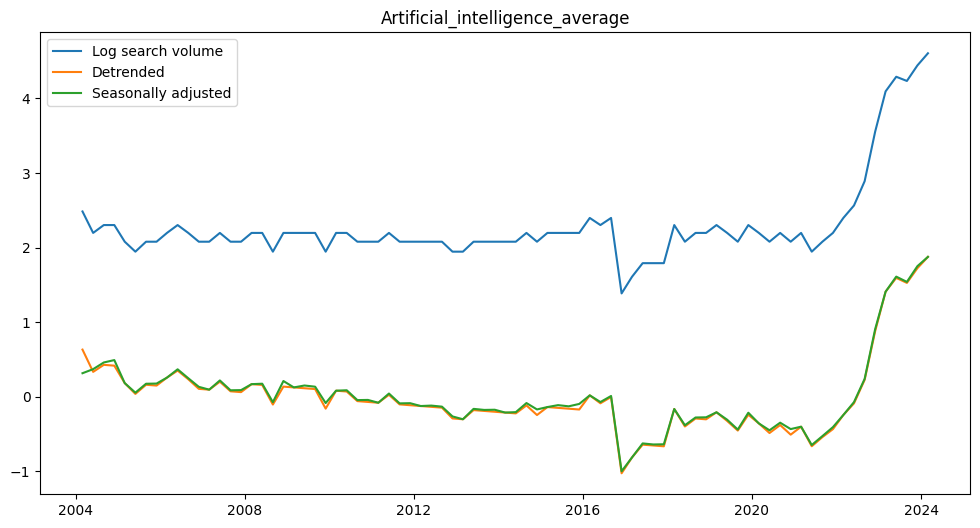

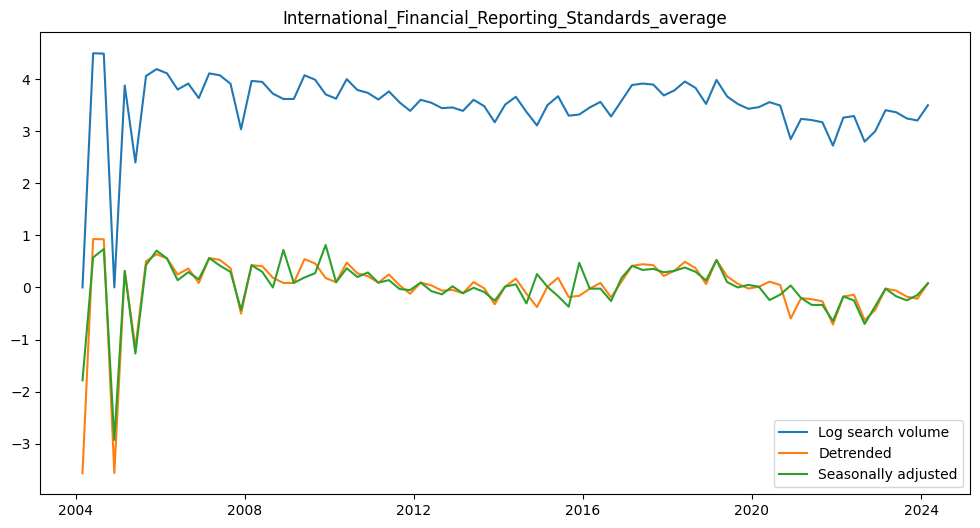

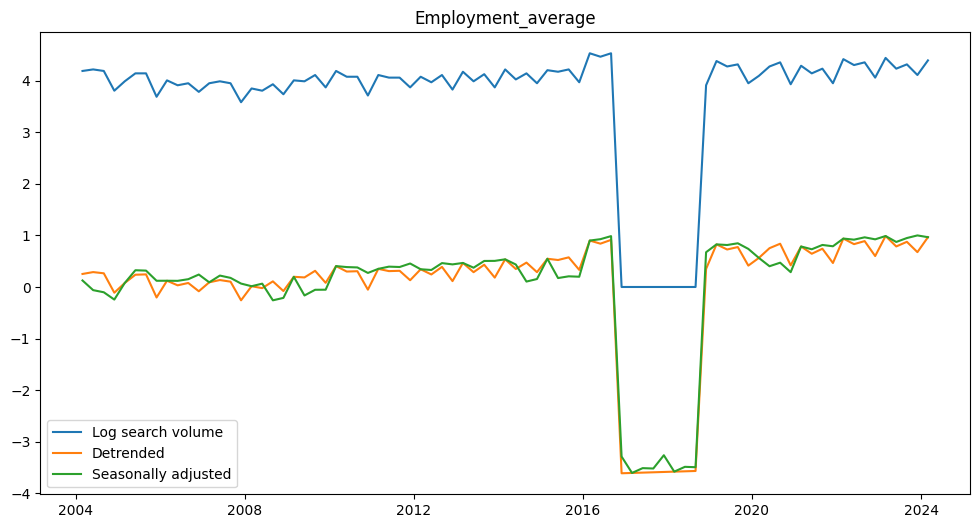

In [ ]:
# Plot the seasonal effect for a search term
for term in search_terms:
    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df[f'log_{term}'], label='Log search volume')
    plt.plot(df.index, df[f'detrended_{term}'], label='Detrended')
    plt.plot(df.index, df[f'seasonally_adjusted_{term}'], label='Seasonally adjusted')
    plt.title(term)
    plt.legend()
    plt.show()